<center><img src='./Figs/cs-logo.png' width=200></center>



<h6><center></center></h6>

<h1>
<hr style=" border:none; height:3px;">
<center> Mention IA - CentraleSupélec - Visual Recognition  </center>
<hr style=" border:none; height:3px;">
</h1>

# Partie 1 : Video Magnification


Cette première partie du TP consistera à implémenter une version d'un algorithme d'amélioration de la qualité d'une vidéo qui se base sur des mouvements Eulériens. Il s'agit de l'approche décrite dans le papier de [Wu el al](http://people.csail.mit.edu/mrub/papers/vidmag.pdf) en 2012 lors de la conference SIGGRAPH. Prenez le temps de lire rapidement ce papier. Vous pouvez aussi consulter la page web du projet [ici](http://people.csail.mit.edu/mrub/evm/) et [ici](http://people.csail.mit.edu/mrub/vidmag/#publications).

Vous pouvez aussi regarder la vidéo qui explique le principe de l'approche.


In [27]:
from IPython.display import IFrame
IFrame('https://www.youtube.com/embed/ONZcjs1Pjmk', width=700, height=350)

La méthode proposée permet d'amplifier les couleurs et les mouvements d'une simple vidéo pour nous aider à visualiser les changements imperceptibles du monde qui nous entoure.



## 1. 1. Récupération des données

Un ensemble de vidéos est disponible dans le répertoire [data](./data). 

Votre premier travail consistera à écrire une fonction permettant de charger et de lire une vidéo et de la transformer en une liste de frames (array numpy).

Vous pourrez pour cela utiliser la fonction `cv2.VideoCapture` en vous inspirant de cette [documentation](https://docs.opencv.org/4.7.0/dd/d43/tutorial_py_video_display.html)



In [4]:
import cv2
import numpy as np


def load_video(vidFile):
    '''
    Reads the video
    :param vidFile: Video file
    :return: video sequence, frame rate, width & height of video frames
    '''
    print('Load video')
    
    cap = cv2.VideoCapture(vidFile)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return None, None, None, None

    fr = int(cap.get(cv2.CAP_PROP_FPS))
    vidWidth = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    vidHeight = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_stack = []

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        video_stack.append(frame)

    cap.release()
    video_stack = np.array(video_stack)

    return video_stack, fr, vidWidth, vidHeight


Tester votre fonction sur une des vidéos fournies dans le répertoire [data](./data)

In [2]:
video_stack, fr, vidWidth, vidHeight = load_video("./data/baby.mp4")

Load video


Pour ceux qui auraient des difficultés avec cette fonction. Vous trouverez dans le répertoire [./data/Images](./data/Images) les images correspondants à la vidéo `baby.mp4` qui est composée de 300 frames.

Dans la suite, vous aurez aussi besoin d'une fonction qui permet de sauvegarder une vidéo. Cette fonction vous est donnée ci-dessous.

In [5]:
import platform


def save_video(video_tensor, fps, name):
    '''
    Creates a new video for the output
    :param video_tensor: filtered video sequence
    :param fps: frame rate of original video
    :param name: output video name
    '''
    print('Save video')
    if platform.system()=='Linux':
        fourcc = cv2.VideoWriter_fourcc(*'MJPG')
    else:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    [height, width] = video_tensor[0].shape[0:2]
    writer = cv2.VideoWriter(name+"Out.mp4", fourcc, fps, (width, height), 1)
    for i in range(video_tensor.shape[0]):
        writer.write(cv2.convertScaleAbs(video_tensor[i]))
    writer.release()

## 1.2 Conversion des images couleur dans l'espace YIQ

La première étape de l'algorithme de magnification consiste à convertir les images RVB composant la vidéo d'entrée en YIQ. La composante Y représente la luminosité, I et Q représentent la chrominance (c'est-à-dire l'information sur les couleurs). Cet espace colorimétrique permet de manipuler les couleurs d'une image indépendamment de sa luminosité. La conversion de RVB en YIQ peut être effectuée à l'aide de la formule suivante

<center><img src='./Figs/rgbToYiq.png' width=400></center>

Compléter les fonctions suivantes permettant de convertir une image de l'espace colorimétrique RGB (ou BGR) à YIQ et inversement.

In [15]:
#convert RBG to YIQ
def rgb2yiq(src):
    '''
    Converts RGB to YIQ
    :param src: RGB image
    :return: YIQ image
    '''
    rgb2yiq_matrix = np.array([[0.299, 0.587, 0.114],
                               [0.595716, -0.274453, -0.321263],
                               [0.211456, -0.522591, 0.311135]])
    yiq = np.dot(src, rgb2yiq_matrix.T)
    return yiq

On a aussi la conversion entre YIQ et RGB
<center><img src='./Figs/yiq2rgb.svg' width=400></center>


In [14]:
#convert YIQ to RBG
def yiq2rgb(src):
    '''
    Converts YIQ to RGB
    :param src: YIQ image
    :return: RGB image
    '''
    yiq2rgb_matrix = np.array([[1, 0.9663, 0.6210],
                               [1, -0.2721, -0.6474],
                               [1, -1.1070, 1.7046]])
    rgb = np.dot(src, yiq2rgb_matrix.T)
    return rgb

Tester vos fonctions sur une image provenant de la video `baby.mp4` et afficher les images obtenues.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.942147000000002..239.97099999999998].


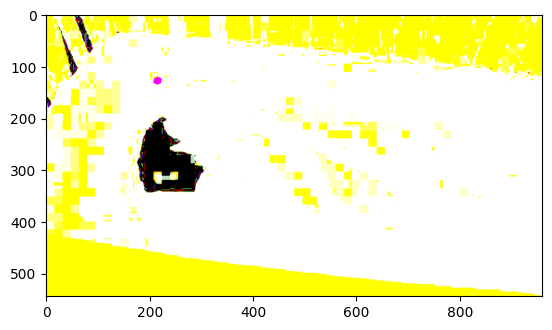

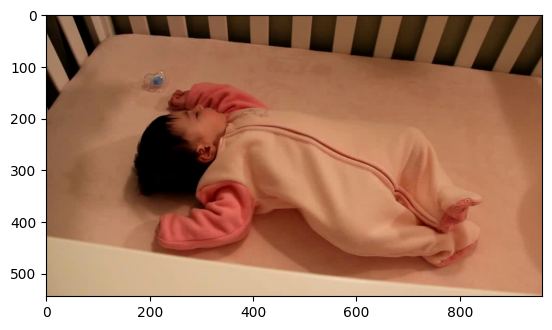

In [6]:
from matplotlib import pyplot as plt

img = cv2.imread("./data/Images/baby_0.jpg",1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_yig = rgb2yiq(img)
plt.imshow(img_yig)
plt.show()
img_rgb = yiq2rgb(img_yig).astype(np.uint8)
plt.imshow(img_rgb)
plt.show()


## Magnification des couleurs
### 1.3 Construction d'une pyramide de gaussiennes.


Pour magnifier les couleurs, il faut construire une pyramide de gaussiennes de $l$ niveaux pour chaque image de la vidéo d'entrée. Pour cela,  il faudra prendre la version YIQ de chaque image originale et la sous-échantillonner d'un facteur 2 pour chaque nouveau niveau de la pyramide.

La première étape du sous-échantillonnage consiste donc à appliquer à l'image une convolution 2D avec le noyau gaussien 5x5 suivant :

$$G_{k} = \frac{1}{256}\begin{bmatrix}1 & 4 & 6 & 4 & 1\\4 & 16 & 24 & 16 & 4\\6 & 24 & 36 & 24 & 6\\4 & 16 & 24 & 16 & 4\\1 & 4 & 6 & 4 & 1\end{bmatrix}$$



Une fois la convolution effectuée, il ne faut conserver qu'un pixel sur deux dans les lignes et les colonnes de l'image, ce qui nous donne une image sous-échantillonnée dont la hauteur et la largeur sont divisées par 2 par rapport au niveau précédent de la pyramide. Nous effectuons ce processus $l -1 $ fois.

<center><img src='./Figs/gaussianpyramid.png' width=400></center>
Image source : [here](https://iipimage.sourceforge.io/documentation/images/)

Ecrivez la fonction qui prend en entrée une image (dans le bon espace colorimétrique) et qui renvoie une pyramide de gaussiennes de $l$ niveaux. Pour cela, vous pourrez utiliser les fonctions de la bibliothèque OpenCv et notamment la fonction [`pyrDown`](https://docs.opencv.org/4.7.0/d4/d1f/tutorial_pyramids.html) déjà vue en Lab. 

In [7]:
def build_gaussian_pyramid(img,levels):
    '''
    Builds a Gaussian pyramid
    :param img: input image
    :param levels: number of levels in the pyramid
    :return: Gaussian pyramid
    '''
    pyramid = [img]
    for i in range(levels-1):
        img = cv2.pyrDown(img)
        pyramid.append(img)
    return pyramid

Tester votre fonction sur l'image [baby_0.jpg ](./data/Images/baby_0.jpg) avec une pyramide de 5 niveaux. Vous pourrez par exemple tester la fonction sur l'image originale en RGB puis ensuite sur l'image transformée dans l'espace colorimétrique YIQ.

RGB:


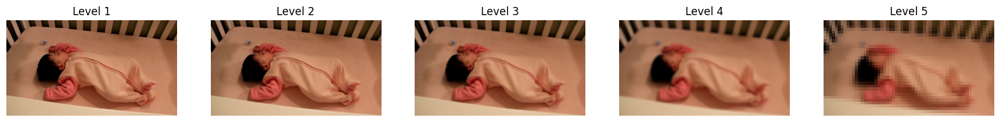

YIQ:


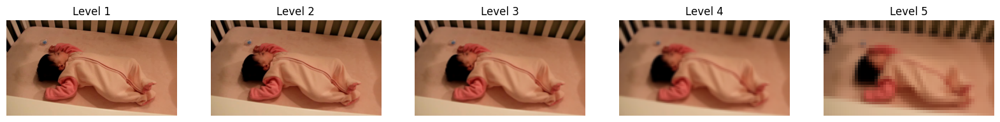

In [8]:
img = cv2.imread("./data/Images/baby_0.jpg",1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Test sur version originale en RGB
print('RGB:')
pyramid = build_gaussian_pyramid(img, 5)
fig, axs = plt.subplots(1, 5, figsize=(20, 20))
for i in range(5):
    axs[i].imshow(pyramid[i])
    axs[i].title.set_text('Level ' + str(i+1))
    axs[i].axis('off')
plt.show()

#Test sur version YIQ
print('YIQ:')
img_yiq = rgb2yiq(img)
pyramid = build_gaussian_pyramid(img_yiq, 5)
fig, axs = plt.subplots(1, 5, figsize=(20, 20))
for i in range(5):
    axs[i].imshow(yiq2rgb(pyramid[i]).astype(np.uint8))
    axs[i].title.set_text('Level ' + str(i+1))
    axs[i].axis('off')
plt.show()

Pour les étapes suivantes, vous ne conserverez que le dernier niveau de la pyramide. Plus précisemment, vous allez utiliser la version sur-échantillonnée du dernier niveau de la pyramide. Pour obtenir cette image suréchantillonnée, vous prendrez le dernier niveau de la pyramide, ajouterez un pixel fixé à 0 tous les deux pixels dans les lignes et les colonnes de l'image sous-échantillonnée et appliquerez $ 4 \times G_k$. Vous devez obtenir une image dont la hauteur et la largeur sont multipliées par 2 par rapport à l'image précédemment suréchantillonnée. Ce processus est effectué $l-1$ fois pour obtenir une image sur-échantillonnée de même dimension que l'image originale. Ici aussi, il est recommandé d'utiliser les fonctions de la bibliothèque OpenCv et notamment la fonction [`pyrUp`](https://docs.opencv.org/4.7.0/d4/d1f/tutorial_pyramids.html).

In [9]:
def generate_last_GaussianPyramid(image, level):
    '''
    Generates the last level of the Gaussian pyramid and upsamples it
    :param image: input image
    :param level: number of levels in the pyramid
    :return: upsampled image
    '''
    pyramid = [image]
    for i in range(level - 1):
        image = cv2.pyrDown(image)
        pyramid.append(image)
    
    # Get the last level of the pyramid
    last_level = pyramid[-1]
    
    # Upsample the last level
    for i in range(level - 1):
        last_level = cv2.pyrUp(last_level)
    
    return last_level

Tester votre fonction sur l'image [baby_0.jpg ](./data/Images/baby_0.jpg) avec une pyramide de 5 niveaux. Vous pourrez par exemple tester la fonction sur l'image originale en RGB puis ensuite sur l'image transformée dans l'espace colorimétrique YIQ.

(544, 960, 3)


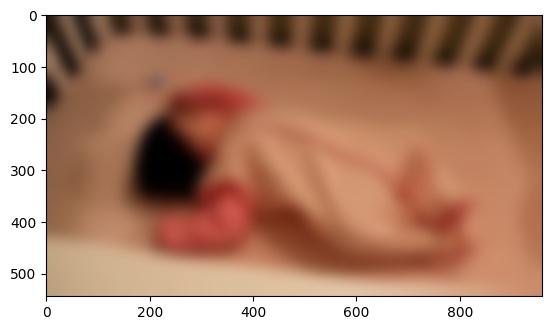

(544, 960, 3)


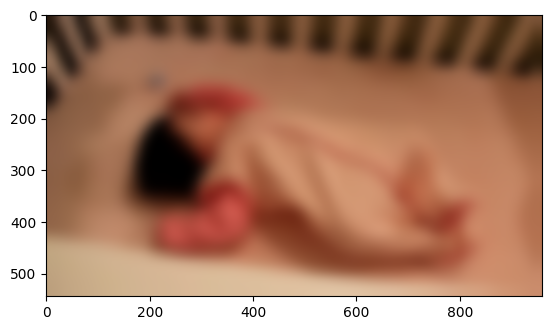

In [10]:
img = cv2.imread("./data/Images/baby_0.jpg",1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print(img.shape)
#Test sur version originale en RGB
last_level = generate_last_GaussianPyramid(img, 5)
plt.imshow(last_level)
plt.show()

#Test sur version YIQ
img_yiq = rgb2yiq(img)
print(img_yiq.shape)
last_level = generate_last_GaussianPyramid(img_yiq, 5)
plt.imshow(yiq2rgb(last_level).astype(np.uint8))
plt.show()


## 1.4 Filtrage Temporel


Cette étape, la plus importante, consiste à filtrer la pyramide de gaussiennes afin de ne conserver que les pixels situés dans la **bande de fréquences** qui nous intéresse $[w_l, w_h]$. Pour cela, nous devons passer du domaine spatial (domaine de l'image) au domaine des fréquences à l'aide d'une transformée de Fourier.

Pour cela, vous allez utiliser le package [`fft`](https://numpy.org/doc/stable/reference/generated/numpy.fft.fft.html) de la bibliothèque `numpy`.

Si vous n'avez jamais entendu parler de la transformée de Fourier, prenez le temps de lire rapidement ce petit [tutorial](https://homepages.inf.ed.ac.uk/rbf/HIPR2/fourier.htm).


Le code ci-dessous vous montre un exemple d'application de cette bibliothèque sur l'image [baby_0.jpg ](./data/Images/baby_0.jpg)

(544, 960)


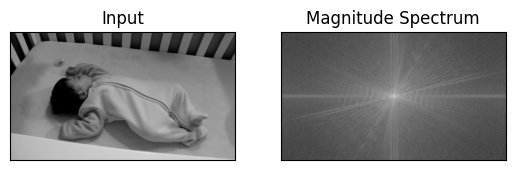

In [11]:
%matplotlib inline
from matplotlib import pyplot as plt

import numpy as np
import cv2


img = cv2.imread("./data/Images/baby_0.jpg",0)
print(img.shape)
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axis =0

fft = np.fft.fft2(img)

# Shift the zero frequency component (i.e., DC component located at the top-left corner) to the center where it will be more easy to analyze

fftShift = np.fft.fftshift(fft)

# compute the magnitude spectrum of the transform

magnitude = 20 * np.log(np.abs(fftShift))

# Visualize the obtained image
# display the original input image
(fig, ax) = plt.subplots(1, 2, )
ax[0].imshow(img, cmap="gray")
ax[0].set_title("Input")
ax[0].set_xticks([])
ax[0].set_yticks([])
# display the magnitude image
ax[1].imshow(magnitude, cmap="gray")
ax[1].set_title("Magnitude Spectrum")
ax[1].set_xticks([])
ax[1].set_yticks([])
# show our plots
plt.show()

Pour notre problème, il s'agira d'appliquer la transformée de Fourier et de ne conserver que les pixels situés dans la **bande de fréquences** qui nous intéresse $[w_l, w_h]$ ce que l'on pourra faire de la manière suivante.

In [12]:
low=0.8333
high = 1

fft = np.fft.fft(img)
fps = 25

frequencies = np.fft.fftfreq(img.shape[0], d=1.0/fps)
bound_low = (np.abs(frequencies - low)).argmin()
bound_high = (np.abs(frequencies - high)).argmin()

bound_low = (np.abs(frequencies - low)).argmin()
bound_high = (np.abs(frequencies - high)).argmin()
fft[:bound_low] = 0
fft[bound_high:-bound_high] = 0
fft[-bound_low:] = 0

Il faut ensuite appliquer la transformée de Fourier inverse pour obtenir une image filtrée. Le résultat d'une transformée de Fourier inverse est une matrice de nombres complexes, il faudra donc prendre la la partie réelle de chaque nombre de la matrice complexe.

In [13]:
resultifft = np.fft.ifft(fft, axis=0).real

A partir des exemples précédents, écrire une fonction `idealTemporalBandpassFilter` qui prend en argument une image, un paramètre `fps`(frame per second), la banque de fréquence voulue (paramètres `low` et `high`) et un argument `axis` qui est fixé par défaut à 0 et qui renvoie la transformée inverse filtrée.

In [14]:
def idealTemporalBandpassFilter(images, fps, freq_range, axis=0):
    '''
    Applies an ideal temporal bandpass filter to the given images
    :param images: input images
    :param fps: frames per second
    :param freq_range: frequency range (low, high)
    :param axis: axis along which to apply the filter
    :return: filtered images
    '''
    low, high = freq_range
    fft = np.fft.fft(images, axis=axis)
    frequencies = np.fft.fftfreq(images.shape[axis], d=1.0/fps)
    
    bound_low = (np.abs(frequencies - low)).argmin()
    bound_high = (np.abs(frequencies - high)).argmin()
    
    fft[:bound_low] = 0
    fft[bound_high:-bound_high] = 0
    fft[-bound_low:] = 0
    
    resultifft = np.fft.ifft(fft, axis=axis).real
    return resultifft

## 1.5 Magnification de l' image et reconstruction.

Pour amplifier les couleurs obtenues avec la pyramide filtrée $F_p$, il est nécessaire d'introduire une valeur $\alpha$ qui va agir comme une **facteur d'amplification**. Pour éviter la création d'artefacts dans l'image de sortie, nous introduisons une autre valeur $A$ qui agira comme un facteur d'atténuation pour les composantes de chrominance de l'image. Nous obtenons notre pyramide filtrée magnifiée $M_{F_P}$ avec une atténuation de la chrominance avec la formule suivante :

$$M_{F_{p}} = \begin{cases}\alpha F_{p}\ \text{if Y component}\\ \alpha A F_{p}\ \text{if I or Q component}\end{cases}$$

On peut finalement reconstruire l'image en ajoutant $M_{F_P}$ à la version YIQ de l'image originale et en convertissant l'image résultante en RGB en pensant bien à limiter les valeurs dans l'intervalle $[0,255]$ pour chaque composante. Ce processus devra être répété pour chaque frame de la vidéo.



Ecrire une fonction `filterGaussianPyramids` qui, pour une frame donnée, prend en entrée la pyramide de gaussiennes, la filtre, applique les opérations d'amplification et d'attenuation. Cette fonction prendra aussi en arguments le `fps`, la bande de fréquences et les paramètres `alpha` et `attenuation`. 


In [15]:
def filterGaussianPyramids(pyramids, fps, freq_range, alpha, attenuation):
    
    filtered_pyramids = []
    for pyramid in pyramids:
        filtered_pyramid = idealTemporalBandpassFilter(pyramid, fps, freq_range)
        amplified_pyramid = np.zeros_like(filtered_pyramid)
        amplified_pyramid[..., 0] = alpha * filtered_pyramid[..., 0] #Canal Y
        amplified_pyramid[..., 1:] = alpha * attenuation * filtered_pyramid[..., 1:] #Canaux I et Q
        filtered_pyramids.append(amplified_pyramid)
    
    return filtered_pyramids

Ecrire une fonction qui reconstruit l'image magnifiée en ajoutant $M_{F_P}$ à la version YIQ de l'image originale et en convertissant l'image résultante en RGB en pensant bien à limiter les valeurs dans l'intervalle $[0,255]$ pour chaque composante. Elle prendra en argument l'image originale et la pyramide de gaussienne filtrée.

In [16]:
def reconstructGaussianImage(image, pyramid):
    yiq_original = rgb2yiq(image)
    # Additionner le signal magnifié aux composantes YIQ de l'image originale
    yiq_reconstructed = yiq_original + pyramid
    # Limiter les valeurs à l'intervalle [0, 255] pour éviter des artefacts
    yiq_reconstructed = np.clip(yiq_reconstructed, 0, 255)

    # Convertir l'image reconstruite de YIQ en RGB
    rgb_reconstructed = yiq2rgb(yiq_reconstructed)

    # Limiter de nouveau et convertir en uint8 pour obtenir une image au format classique
    rgb_reconstructed = np.clip(rgb_reconstructed, 0, 255).astype(np.uint8)

    return rgb_reconstructed

Tester vos fonctions sur l'image `baby_0.jpg` avec une pyramide de 4 niveaux, 

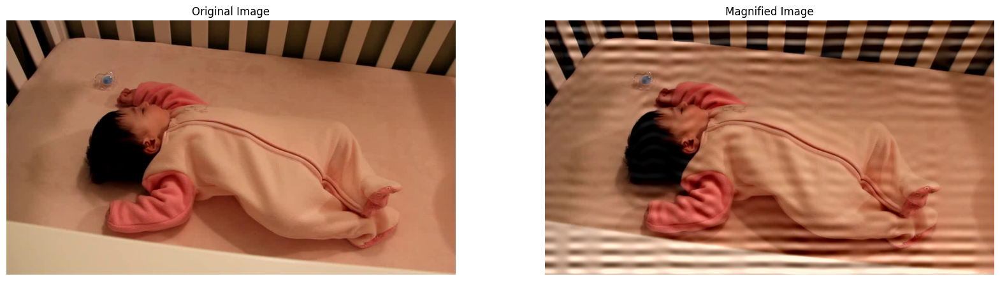

In [17]:
img = cv2.imread("./data/Images/baby_0.jpg", 1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Convertir l'image en YIQ
img_yiq = rgb2yiq(img)

#Générer le dernier niveau suréchantillonné de la pyramide gaussienne à 4 niveaux
last_level = generate_last_GaussianPyramid(img_yiq, 4)

fps = 25
freq_range = (0.8333, 1)  
alpha = 10
attenuation = 0.1  

#dupliquer l'image N fois sur l'axe 0 afin de simuler l'aspect temporel en duplisuqant 10 fois la même afin de créér un faux ensemble de frames
sequence = np.repeat(last_level[np.newaxis, ...], repeats=10, axis=0)

# Appliquer le filtrage temporel et l'amplification sur la séquence simulée
magnified_sequence = filterGaussianPyramids(sequence, fps, freq_range, alpha, attenuation)
# autre solution possible sans sequence (avec img_yiq directement) mais dans ce cas nous la dimension H sera considére comme la dimension temporelle --> creer encore plus de stripes!!

# 7. Reconstruire l'image magnifiée en ajoutant le signal amplifié à l'image originale en YIQ
magnified_image = reconstructGaussianImage(img, magnified_sequence[0])

#subplots pour afficher l'image originale et l'image magnifiée
fig, axs = plt.subplots(1, 2, figsize=(20, 20))
axs[0].imshow(img)
axs[0].title.set_text('Original Image')
axs[0].axis('off')
axs[1].imshow(magnified_image)
axs[1].title.set_text('Magnified Image')
axs[1].axis('off')
plt.show()

### 1.6 Application à la vidéo


Ecrire le code permettant d'appliquer cela à une vidéo et qui renverra donc la vidéo magnifiée.

In [18]:
def gaussian_video(video_tensor, levels):
    '''
    For a given video sequence the function creates a video with
    the highest (specified by levels) Gaussian pyramid level
    :param video_tensor: Video sequence
    :param levels: Specifies the Gaussian pyramid levels
    :return: a video sequence where each frame is the downsampled of the original frame
    '''
    gauss_vid = []
    for frame in video_tensor:
        # Construire la pyramide pour ce frame
        pyramid = build_gaussian_pyramid(frame, levels)
        # On récupère le dernier niveau (le plus petit)
        gauss_vid.append(pyramid[-1])

    return np.array(gauss_vid)

In [19]:
low = 0.4
high = 3
alpha = 10
chromAttenuation = 0.1
freq_range = (low, high)
levels = 5
output_name = "baby"

video_stack, fps, width, height = load_video("./data/baby.mp4")

if video_stack is None:
    print("Erreur de chargement de la vidéo.")
    exit(1)

# Conversion en float32 pour éviter les problèmes de dépassement
video_stack = video_stack.astype(np.float32)
num_frames = video_stack.shape[0]

# 2) Pour chaque frame, conversion BGR -> RGB -> YIQ,
last_levels = []
originals_rgb = [] 
for i in range(num_frames):
    frame_bgr = video_stack[i]

    # BGR -> RGB
    frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
    originals_rgb.append(frame_rgb)

    # RGB -> YIQ
    frame_yiq = rgb2yiq(frame_rgb)

    # Pyramide gaussienne -> dernier niveau suréchantillonné
    last_level = generate_last_GaussianPyramid(frame_yiq, levels)
    last_levels.append(last_level)

last_levels = np.array(last_levels, dtype=np.float32)
# 3) Filtrage temporel et amplification
amplified_last_levels = filterGaussianPyramids(last_levels,fps,freq_range,alpha,chromAttenuation)

# Si filterGaussianPyramids retourne une liste, on la convertit en np.array
if isinstance(amplified_last_levels, list):
    amplified_last_levels = np.array(amplified_last_levels)

# 4) Reconstruction de chaque frame
magnified_frames_bgr = []
for i in range(num_frames):
    reconstructed_rgb = reconstructGaussianImage(
        originals_rgb[i], amplified_last_levels[i]
    )
    # Conversion RGB -> BGR pour l'enregistrement
    out_bgr = cv2.cvtColor(reconstructed_rgb, cv2.COLOR_RGB2BGR)
    magnified_frames_bgr.append(out_bgr)

# Convertir la liste en tableau numpy
magnified_frames_bgr = np.array(magnified_frames_bgr, dtype=np.uint8)

# 5) Sauvegarder la vidéo magnifiée
save_video(magnified_frames_bgr, fps, output_name)

Load video
Save video



## Magnification des mouvements
### 1.6 Pyramide de laplaciens

Pour la magnification des mouvements, il faut se concentrer sur les bords des objets dans la vidéo. Pour cela, vous allez utiliser la différence entre deux niveaux adjacents de la pyramide gaussienne, c'est-à-dire une pyramide de Laplacien comme illustré sur la figure ci-dessous

<center><img src='./Figs/laplacian_pyramid.png' width=500></center>



Ecrire la fonction `create_laplacian_pyramid` qui prend en agurment une image et le niveau voulu $l$ de la pyramide et qui renvoie une pyramide de laplacien de $l$ niveaux.

In [6]:
def create_laplacian_pyramid(image, levels):
    """
    Builds a Laplace pyramid for an image, i.e. video frame
    :param image: Image, i.e. single video frame
    :param levels: Specifies the Laplace pyramid levels
    :return: Returns a pyramid of nr. levels images
    """
    pyramid = []
    current_image = image.copy()
    for i in range(levels):
        down = cv2.pyrDown(current_image)
        up = cv2.pyrUp(down)
        if up.shape != current_image.shape:
            up = cv2.resize(up, (current_image.shape[1], current_image.shape[0]))
        diff = current_image - up
        pyramid.append(diff)
        current_image = down
    return pyramid

Ecrire une fonction qui permet de créer la pyramide des laplaciens pour l'ensemble d'une vidéo.

In [7]:
def laplacian_video_pyramid(video_stack, levels):
    """
    Creates a Laplacian pyramid for the whole video sequence
    :param video_stack: Video sequence
    :param levels: Specifies the Laplace pyramid levels
    :return: A list of arrays where each element corresponds to a pyramid level
    """
    print("Build laplace pyramid")
    laplace_video = []
    for frame in video_stack:
        pyramid = create_laplacian_pyramid(frame, levels)
        laplace_video.append(pyramid)
    return laplace_video

### 1.7 Filtre de Butterworth

Pour l'étape de filtrage de la magnification des mouvements, il faut un filtre qui tolère les fréquences en dehors de la plage donnée, car les changements de mouvements ne sont pas aussi uniformes que les changements de couleurs. Nous utiliserons donc un filtre de Butterworth dont un descriptif est donné [ici](https://fr.wikipedia.org/wiki/Filtre_de_Butterworth).

Dans le papier original, les auteurs proposent d'utiliser un filtre passe-bande de Butterworth du premier ordre, comme dans l'exemple suivant.

<center><img src='./Figs/butterworth.png' width=500></center>


Filtre de Butterworth avec $w_l = 2 $ et $w_h = 4$.





Pour filtrer les images, il faut d'abord calculer les coefficients
 $b_i$ et $a_i$ du filtre de Butterworth étant donné la bande de fréquence $[w_l, w_h]$ et le frame rate $fps$ de la video comme fréquence temporelle.


Pour ce filtrage, vous pourrez utiliser la fonction [`butter`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html) de `scipy`.
 
 
Vous trouverez ci-dessous la fonction  `butter_bandpass` qui calcule le filtre de Butterworth d'ordre 1 étant donné la bande de fréquence et le frame rate.
 
 
 

In [8]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fps, order=1):
    '''
    Calculates the Butterworth bandpass filter
    :param lowcut: low frequency cutoff
    :param highcut: high frequency cutoff
    :param fs: video frame rate
    :param order: filter order - per default = 1
    :return: Numerator (b) and denominator (a) polynomials of the IIR filter.
    '''

    low = lowcut / fps
    high = highcut / fps
    b, a = butter(order, [low, high], btype='band')
    return b, a

### 1.8 Application du filtre de Butterworth au Laplacien.

Il s'agit maintenant d'appliquer le filtre en suivant l'équation ci-dessous.

$$y[n] = \frac{1}{a_0}(b_{0}x[n] + b_{1}x[n - 1] - a_{1}y[n - 1])$$
 
Avec  $y[n]$ la nième image de la pyramide laplacienne filtrée et $x[n]$ la nième pyramide de Laplace (correspondant à la nième frame)

$y[0]$  et $x[0]$ sont les pyramides de Laplace pour la première frame de la vidéo.


Ecrire la fonction `apply_filter_butter` qui prend en entrée une séquence d'images et qui applique l'équation précédente, donc le filtre de Butterworth à tous les niveaux d'une pyramide de Laplace d'une séquence d'images.


In [9]:
def apply_filter_butter_to_lapalcian(laplace_video_list, levels, low, high, fps):
    """
    Applies the Butterworth filter on video sequence
    :param laplace_video_list: Laplace video pyramid
    :param levels: Pyramid levels
    :param low: Temporal low frequency cutoff
    :param high: Temporal high frequency cutoff
    :param fps: Video frame rate
    :return: Filtered pyramid levels
    """
    print("Apply Butterworth filter")
    
    # Get filter coefficients
    b, a = butter_bandpass(low, high, fps, order=1)
    
    # Reorganize data: one array per pyramid level
    num_frames = len(laplace_video_list)
    filtered_video = []
    
    # Process each level of the pyramid
    for level in range(levels):
        # Extract frames for this level
        level_frames = np.array([frame[level] for frame in laplace_video_list])
        
        # Apply the filter using the given equation
        filtered_frames = np.zeros_like(level_frames)
        filtered_frames[0] = level_frames[0] 
        
        for n in range(1, num_frames):
            filtered_frames[n] = (1/a[0]) * (b[0]*level_frames[n] + b[1]*level_frames[n-1] - a[1]*filtered_frames[n-1])
        
        filtered_video.append(filtered_frames)
    
    return filtered_video

### 1.8 Magnification & Reconstruction

Dans le cas de la magnification de mouvements, tous les niveaux de la pyramide de Laplacien sont utilisés et donc l'étape de magnification et de reconstruction des mouvements est un peu plus compliquée. Tout d'abord, nous devons adapter dynamiquement le facteur d'amplification pour chaque niveau de la pyramide. Pour ce faire, nous introduisons la longueur d'onde spatiale $\lambda$ qui représente un niveau donnée de la pyramide de Laplace filtrée 

$$\lambda = \sqrt{h^{2} + w^{2}}$$

Avec $h$ et $w$ qui sont respectivement la hauteur et la largeur du niveau considéré. 

$\lambda$ et le facteur d'amplification $\alpha$ sont liés par l'équation suivante : 

$$(1 + \alpha)\delta (t) < \frac{\lambda}{8}$$

Avec $\delta (t)$ le facteur de déplacement (se reporter à l'article pour plus de détails).

Nous pouvons maintenant introduire la longueur d'onde spatiale de coupure $\lambda_{c}$

$$(1 + \alpha)\delta(t) = \frac{\lambda_{c}}{8} \implies \delta(t) = \frac{\frac{\lambda_{c}}{8}}{1 + \alpha}$$

Le nouveau facteur d'amplication $\alpha_{\textrm{new}}$ pour un niveau donnée de la pyramide $F_p$ peut alors être obtenu par 

$$\alpha_{\textrm{new}} = \frac{\frac{\lambda}{8}}{\delta(t)} - 1$$

Le facteur d'amplication est alors pour un niveau $l$ de $F_p$

$$\alpha_{l} = min(\alpha, \alpha_{\textrm{new}})$$

De la même manière que pour la magnification de la pyramide de Gaussiennes, nous obtenons notre niveau de pyramide filtrée magnifiée avec 

$$M_{F_{p}}[l] = \begin{cases}\alpha_{l} F_{p}[l]\ \text{if Y component}\\ \alpha_{l} A F_{p}[l]\ \text{if I or Q component}\end{cases}$$


Nous répétons le processus précédent pour tous les niveaux (sauf le premier et le dernier) de $F_p$.

Enfin, nous reconstruisons notre image en suréchantillonnant tous les niveaux de $M_{F_{p}}$ aux dimensions de l'image originale, en l'ajoutant à la version YIQ de l'image originale, en convertissant l'image résultante en RVB et en limitant les valeurs de l'image RVB résultante à $[0,255]$. Ce processus est répété pour chaque frame de la vidéo.

Compléter la fonction ci-dessous qui permet de mettre en oeuvre ce processus.

In [10]:
def apply_butter(laplace_video_list,levels,alpha,cutoff,low,high,fps,width,height,chromAttenuation):
    """
    Applies the Butterworth filter on the video sequence, magnifies the filtered sequence,
    and cuts off spatial frequencies.
    :param laplace_video_list: Laplace video pyramid (list of length "levels", each element is an array
                               of shape (num_frames, H_lvl, W_lvl, channels)).
    :param levels: Pyramid levels.
    :param alpha: Global magnification factor.
    :param cutoff: Spatial frequencies cutoff factor (lambda_c).
    :param low: Temporal low frequency cutoff.
    :param high: Temporal high frequency cutoff.
    :param fps: Video frame rate.
    :param width: Video frame width (original).
    :param height: Video frame height (original).
    :param chromAttenuation: Chrominance attenuation factor.
    :return: List of filtered and magnified sequences for each pyramid level.
    """
    print("Apply Butterworth filter and magnification")
    
    # Apply Butterworth bandpass filter to each level of the Laplacian pyramid
    filtered_laplacian = apply_filter_butter_to_lapalcian(laplace_video_list, levels, low, high, fps)
    
    # For each level, compute the spatial wavelength and adjust the magnification factor
    magnified_laplacian = []
    
    for level in range(levels):
        level_frames = filtered_laplacian[level]
        
        # Calculate current level dimensions
        curr_height, curr_width = level_frames[0].shape[:2]
        
        # Calculate spatial wavelength lambda for this level
        lambda_value = np.sqrt(curr_height**2 + curr_width**2)
        
        # Calculate displacement factor delta_t using lambda_c (cutoff)
        delta_t = (cutoff / 8.0) / (1.0 + alpha)
        
        # Calculate new alpha
        alpha_new = (lambda_value / 8.0) / delta_t - 1.0
        
        # Use the minimum of alpha and alpha_new as the magnification factor
        alpha_level = min(alpha, alpha_new)
        
        # Apply magnification with chrominance attenuation
        level_frames = level_frames.astype(np.float32)
        magnified_frames = np.zeros_like(level_frames)
        
        # Apply to Y component (luminance)
        magnified_frames[..., 0] = alpha_level * level_frames[..., 0]        
        magnified_frames[..., 1:] = alpha_level * chromAttenuation * level_frames[..., 1:]
        
        magnified_laplacian.append(magnified_frames)
    
    return magnified_laplacian


Ecrire une fonction qui permet de reconstruire une séquence vidéo à partir de la pyramide de Laplaciens filtrée

In [11]:
def reconstruct(filtered_video, levels):
    """
    Reconstructs a video sequence from the filtered Laplace video pyramid.

    :param filtered_video: List of arrays, each corresponding to a pyramid level.
                           Each filtered_video[lvl] has shape (num_frames, H_lvl, W_lvl, channels).
    :param levels: Number of pyramid levels.
    :return: Reconstructed video sequence, an array of shape (num_frames, H, W, channels).
    """
    print("Reconstruct video")

    # Vérifier que l'entrée est valide
    if not filtered_video or len(filtered_video) != levels:
        print(f"Erreur: Nombre de niveaux incorrect. Attendu: {levels}, Reçu: {len(filtered_video)}")
        return None

    num_frames = filtered_video[0].shape[0]
    reconstructed_frames = []

    # Reconstruire chaque frame
    for n in range(num_frames):
        # Commencer par le niveau le plus bas (le plus petit)
        current = filtered_video[levels - 1][n].copy()

        # Remonter la pyramide
        for lvl in range(levels - 2, -1, -1):
            # Agrandir l'image courante
            current = cv2.pyrUp(current)

            # S'assurer que les dimensions correspondent
            if current.shape[:2] != filtered_video[lvl][n].shape[:2]:
                current = cv2.resize(current,(filtered_video[lvl][n].shape[1], filtered_video[lvl][n].shape[0]),
                )

            # Ajouter le niveau de Laplacien filtré
            current = current + filtered_video[lvl][n]

        reconstructed_frames.append(current)

    return np.array(reconstructed_frames)


Ecrire une fontion qui permet de mettre en place l'amplification de mouvement sur une vidéo complète et sauvegarder la vidéo amplifiée.

In [ ]:
def motionmagnification(vidFile, alpha, cutoff, low, high, chromAttenuation, name):
    """
    Performs motion magnification on the video by applying a Butterworth bandpass filter
    on the Laplacian video pyramid, magnifies the filtered sequence, reconstructs the video,
    and saves the output video.
    :param vidFile: Video file path.
    :param alpha: Global magnification factor.
    :param cutoff: Spatial frequencies cutoff factor (lambda_c).
    :param low: Temporal low frequency cutoff.
    :param high: Temporal high frequency cutoff.
    :param chromAttenuation: Chrominance attenuation factor.
    :param name: Output video name (without extension).
    """
    # 1. Load the video
    video_stack, fps, width, height = load_video(vidFile)
    if video_stack is None:
        print("Error loading video")
        return
    
    print(f"Video loaded: {video_stack.shape}, fps: {fps}")
    
    # 2. Convert each frame to YIQ color space
    yiq_frames = []
    for frame in video_stack:
        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        # Convert RGB to YIQ
        yiq_frame = rgb2yiq(rgb_frame)
        yiq_frames.append(yiq_frame)
    
    yiq_frames = np.array(yiq_frames)
    
    levels = 5  # Number of pyramid levels
    print("Creating Laplacian pyramids...")
    laplace_pyramids = laplacian_video_pyramid(yiq_frames, levels)
    
    magnified_laplacian = apply_butter(laplace_pyramids, levels, alpha, cutoff, low, high, fps, width, height, chromAttenuation)
    
    print("Reconstructing video...")
    reconstructed_yiq = reconstruct(magnified_laplacian, levels)
    
    print("Converting to RGB...")
    magnified_frames = []
    for i, yiq_frame in enumerate(yiq_frames):
        # Add magnified signal to original YIQ frame
        magnified_yiq = yiq_frame + reconstructed_yiq[i]
        # Clip to valid range
        magnified_yiq = np.clip(magnified_yiq, 0, 255)
        # Convert YIQ back to RGB
        magnified_rgb = yiq2rgb(magnified_yiq)
        # Clip RGB values to [0, 255]
        magnified_rgb = np.clip(magnified_rgb, 0, 255).astype(np.uint8)
        # Convert RGB to BGR for OpenCV
        magnified_bgr = cv2.cvtColor(magnified_rgb, cv2.COLOR_RGB2BGR)
        magnified_frames.append(magnified_bgr)
    
    magnified_frames = np.array(magnified_frames)
    
    print("Saving video...")
    save_video(magnified_frames, fps, name)
    
    print(f"Motion magnification completed. Output saved as {name}Out.mp4")


Tester sur les vidéos du répertoire [data](./data). Vous sauvegarderez les vidéos résultats. Ci-dessous un ensemble de valeurs pour les paramètres pour la vidéo baby mais vous pouvez bien evidemment tester différents paramètres.

In [16]:
# Quelques paramètres à utiliser
# pour la video baby

low = 0.4
high = 3
alpha = 15
chromAttenuation = 0.1
cutoff =  16

motionmagnification("./data/baby.mp4", alpha, cutoff, low, high, chromAttenuation, "baby")


Load video
Video loaded: (301, 544, 960, 3), fps: 30
Creating Laplacian pyramids...
Build laplace pyramid
Apply Butterworth filter and magnification
Apply Butterworth filter


C:\Users\Gabriel\AppData\Local\Temp\ipykernel_852\856093418.py:45: RuntimeWarning: overflow encountered in cast
  level_frames = level_frames.astype(np.float32)
C:\Users\Gabriel\AppData\Local\Temp\ipykernel_852\856093418.py:49: RuntimeWarning: overflow encountered in multiply
  magnified_frames[..., 0] = alpha_level * level_frames[..., 0]
C:\Users\Gabriel\AppData\Local\Temp\ipykernel_852\856093418.py:50: RuntimeWarning: overflow encountered in multiply
  magnified_frames[..., 1:] = alpha_level * chromAttenuation * level_frames[..., 1:]


Reconstructing video...
Reconstruct video


C:\Users\Gabriel\AppData\Local\Temp\ipykernel_852\2544774640.py:36: RuntimeWarning: invalid value encountered in add
  current = current + filtered_video[lvl][n]


Converting to RGB...


C:\Users\Gabriel\AppData\Local\Temp\ipykernel_852\3048533132.py:56: RuntimeWarning: invalid value encountered in cast
  magnified_rgb = np.clip(magnified_rgb, 0, 255).astype(np.uint8)


Saving video...
Save video
Motion magnification completed. Output saved as babyOut.mp4


# Partie 2 : Générateur d'images Low Poly


L'objectif de cette partie est de mettre en place plusieurs approches simples permettant, à partir d'une image source de générer une image artistique dite Low Poly.
Ces images ont comme particularité  :

 + Les objets illustrés sont très abstraits et schématiques. Ils ne respectent pas vraiment la réalité.
 + Les objets sont illustrés à l'aide de formes basiques, tels que des triangles et des polygones simples.
 + Une palette de couleur simple est utilisé et il n'y pas beaucoup de contenu fréquentielle ou des textures complexes.

Il s'agit ici. de développer des fonctions permettant de transformer une image en une version Low-Poly comme sur l'exemple ci-dessous


<center><img src='./Figs/oscar.jpg' width=200></center>


<center><img src='./Figs/oscarlowpoly.png' width=200></center>

## 2.1 : Approche à l'aide de points d'intérêts

Une première approche consiste à faire en place la chaîne de traitements suivantes :

 1. Déterminer des points  (d'interêts ) dans l'image
 2. Générer une triangulation de type Delaunay
 3. Remplir les triangles à l'aide des couleurs de l'image originale.

Il s'agit donc de mettre en place cette première statégie.


Pour l'extraction des points dans l'image, vous comparerez trois stratégies :
 + La sélection de points de manière aléatoire
 + La sélection de points sur les contours
 + la sélection de points d'intérêts (Harris, sift et cie)

### 2.1.1 Extraction de points d'intérêts de manière aléatoire

Ecrire une fonction qui prend en entrée une image et qui selectionne de manière aléatoire un ensemble de $n$ points dans une image et qui renvoie cet ensemble de points.


In [ ]:
import os

def select_at_random (img, n):
    height, width = img.shape[:2]
    x = np.random.randint(0, width, n)
    y = np.random.randint(0, height, n)
    points = np.stack((x, y), axis=1)
    return points

### 2.1.2 Extraction de points d'intérêts sur les contours.

Ecrire une fonction qui prend en entrée une image et qui selectionne de manière aléatoire un ensemble de $n$ points sur les contours d'une image donnée. Vous pourrez par exemple prendre pour cela le détecteur de contours de Canny déjà implémenté dans OpenCV : voir [ici](https://docs.opencv.org/4.7.0/da/d22/tutorial_py_canny.html).


In [ ]:
def select_at_edge (img, n):
    #Conversion en niveau de gris si l'image est en couleur
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
    #Détection des contours avec Canny
    edges = cv2.Canny(gray, 100, 200)

    #Coordonnées des pixels détectés comme contours
    y_coords, x_coords = np.nonzero(edges)
    edge_points = np.stack((x_coords, y_coords), axis=-1)

    #S'il y a moins de n points détectés, on retourne tous les points
    if len(edge_points) < n:
        return edge_points

    #Tirage aléatoire sans remise
    indices = np.random.choice(len(edge_points), size=n, replace=False)
    selected_points = edge_points[indices]
    return selected_points

### 2.1.3 Extraction de points d'intérêts de manière aléatoire

Ecrire une fonction qui prend en entrée une image et qui calcule à partir des fonctions pré-définies dans la bibliothèque OpenCV les points d'intérêts de cette images. Vous pouvez utiliser ici plusieurs approches de votre choix pour l'extraction de ces points d'intérêts comme par exemple les détecteurs sift ou d'autres. Voir [ici](https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html)


In [ ]:
def select_interest_points (img, n):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
    sift = cv2.SIFT_create()
    keypoints = sift.detect(gray, None)
    #Tri des keypoints par force de réponse
    keypoints = sorted(keypoints, key=lambda kp: -kp.response)

    # Extraction des coordonnées des keypoints
    pts = np.array([kp.pt for kp in keypoints])
    pts = np.round(pts).astype(int)  

    h, w = img.shape[:2]
    #Ajout des 4 coins de l'image
    corners = np.array([[0, 0], [0, h - 1], [w - 1, 0], [w - 1, h - 1]])
    nb_interest = max(n - 4, 0)

    #Sélection des nb_interest points parmi les points détectés
    if pts.shape[0] < nb_interest:
        selected_pts = (pts)
    else:
        selected_pts = pts[:nb_interest]

    points = np.concatenate((corners, selected_pts), axis=0)

    return points

In [ ]:
def select_harris_points(img, n):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img.copy()
    gray = np.float32(gray)

    dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

    #Dilatation pour marquer les coins
    dst = cv2.dilate(dst, None)

    threshold = 0.1 * dst.max()
    corner_indices = np.argwhere(dst > threshold)
    harris_points = np.flip(corner_indices, axis=1)

    #Tri des points
    responses = [dst[y, x] for x, y in harris_points]
    sorted_indices = np.argsort(responses)[::-1]
    sorted_points = harris_points[sorted_indices]

    #Sélection des points en complément des 4 coins
    nb_interest = max(n - 4, 0)
    if sorted_points.shape[0] < nb_interest:
        selected_pts = sorted_points
    else:
        selected_pts = sorted_points[:nb_interest]

    #Récupération des dimensions de l'image
    h, w = img.shape[:2]
    #Ajout des 4 coins de l'image
    corners = np.array([[0, 0], [w - 1, 0], [0, h - 1], [w - 1, h - 1]])
    points = np.concatenate((corners, selected_pts), axis=0)
    
    return points

In [ ]:
def select_shi_tomasi_points(img, n):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img.copy()
    nb_interest = max(n - 4, 0)
    corners = cv2.goodFeaturesToTrack(
        gray, maxCorners=10000, qualityLevel=0.01, minDistance=5
    )

    if corners is None:
        h, w = img.shape[:2]
        corners_img = np.array([[0, 0], [w - 1, 0], [0, h - 1], [w - 1, h - 1]])
        return corners_img

    corners = np.int0(corners)
    shi_points = np.squeeze(corners, axis=1) 

    if len(shi_points) > nb_interest:
        shi_points = shi_points[:nb_interest]

    h, w = img.shape[:2]
    corners_img = np.array([[0, 0], [w - 1, 0], [0, h - 1], [w - 1, h - 1]])
    points = np.concatenate((corners_img, shi_points), axis=0)

    return points

Ajouter à la liste des points les 4 coins de l'image

In [ ]:
#points = [[0, 0], [0, h-1], [w-1, 0], [w-1, h-1]]

#Ajout des 4 coins aux fonctions random et edge

def select_at_random(img, n):
    height, width = img.shape[:2]
    x = np.random.randint(0, width, n)
    y = np.random.randint(0, height, n)
    random_points = np.stack((x, y), axis=1)
    corners = np.array([[0, 0], [width - 1, 0], [0, height - 1], [width - 1, height - 1]])
    points = np.concatenate((corners, random_points), axis=0)
    return points

def select_at_edge(img, n):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
    edges = cv2.Canny(gray, 100, 200)
    y_coords, x_coords = np.nonzero(edges)
    edge_points = np.stack((x_coords, y_coords), axis=-1)
    if len(edge_points) < n:
        selected_edge_points = edge_points
    else:
        indices = np.random.choice(len(edge_points), size=n, replace=False)
        selected_edge_points = edge_points[indices]
    height, width = img.shape[:2]
    corners = np.array([[0, 0], [width - 1, 0], [0, height - 1], [width - 1, height - 1]])
    points = np.concatenate((corners, selected_edge_points), axis=0)
    return points

### 2.1.4 Génération d'une triangulation de Delaunay à partir des points extraits.

Il s'agit ici de construire une [triangulation de Delaunay](https://fr.wikipedia.org/wiki/Triangulation_de_Delaunay) à partir des points extraits dans les étapes précédentes.

Pour cela, vous pourrez utiliser la bibiothèque `scipy` et le package [`spatial.Delaunay`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.Delaunay.html).

Le code ci-dessous vous montre un exemple simple d'utilisation de ce package. On voit notamment que les indices des points qui forment les simplexes dans la triangulation sont données dans `_.simplices`.  


In [ ]:
import numpy as np
points = np.array([[0, 0], [0, 1.1], [1, 0], [1, 1]])
from scipy.spatial import Delaunay
tri = Delaunay(points)

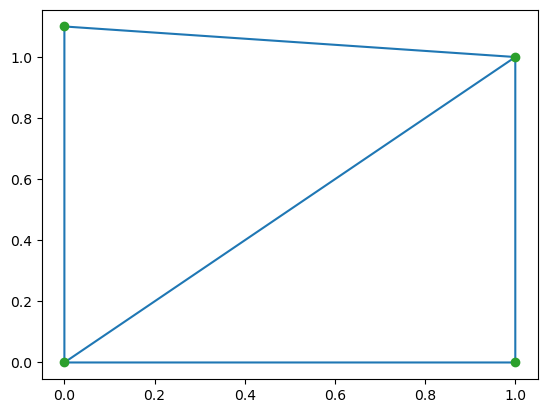

In [ ]:
import matplotlib.pyplot as plt
plt.triplot(points[:,0], points[:,1], tri.simplices)
plt.plot(points[:,0], points[:,1], 'o')
plt.show()

Ecrire une fonction qui à partir d'un ensemble de points extraits d'une image contruit la triangulation de Delaunay de cet ensemble de points 

In [ ]:
def get_delaunay (image):
    points = select_interest_points(image, 1000)
    tri = Delaunay(points)
    return tri,points

### 2.1.5  Remplir les triangles à l'aide des couleurs de l'image originale

Ici il s'agit d'assigner chaque pixel à un triangle de la triangulation de Delaunay et de faire la moyenne des couleurs dans ce triangle pour obtenir l'image Low Poly



In [ ]:
def get_colour_of_tri(tri, image):
    # assign each pixel to a triangle, and then take all the pixels in a triangle and average the colour and return the average color
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    # Remplissage du triangle dans le masque (les pixels à l'intérieur prendront la valeur 1)
    cv2.fillConvexPoly(mask, tri, 1)
    if len(image.shape) == 3:
        mean_val = cv2.mean(image, mask=mask)[:3]
        return tuple(map(int, mean_val))
    else:
        mean_val = cv2.mean(image, mask=mask)[0]
        return int(mean_val)

Ecrire la fonction permettant de générer l'image Low Poly. Il s'agit donc de tracer les triangles et de donner la couleur moyenne des pixels à l'intérieur de chaque triangle. Les fonctions [`cv2.line`](https://docs.opencv.org/4.x/d6/d6e/group__imgproc__draw.html) et [`find_simplex`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.Delaunay.find_simplex.html) pourraient vous être utiles.

In [ ]:
def generate_low_poly_img(img):
    low_poly = np.zeros_like(img)
    #Extraction des points et calcul de la triangulation de Delaunay
    tri, points = get_delaunay(img)
    #Parcours des triangles de la triangulation
    for simplex in tri.simplices:
        #Récupération des 3 sommets du triangle
        pts = points[simplex]
        pts = pts.astype(np.int32)
        # Calcul de la couleur moyenne dans ce triangle
        color = get_colour_of_tri(pts, img)
        # Remplissage du triangle dans l'image Low Poly
        cv2.fillConvexPoly(low_poly, pts, color)
        # Dessin des contours du triangle
        cv2.polylines(low_poly, [pts], isClosed=True, color=(0, 0, 0), thickness=1)

    return low_poly

Tester vos différentes approches sur les images du répertoire [lowpoly](./lowpoly) et afficher les images originales et les images obtenues.

## Comparaison des différentes méthodes

#### 1. Sélection de points de manière aléatoire

In [ ]:
def get_delaunay(image):
    points = select_at_random(image, 10000)
    tri = Delaunay(points)
    return tri, points

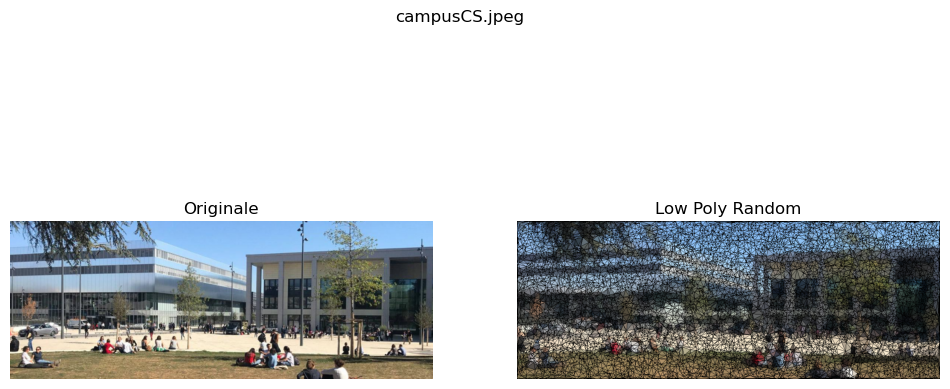

KeyboardInterrupt: 

In [ ]:
input_directory = "./lowpoly"
output_directory = "./lowpoly_results_random"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [
    f for f in os.listdir(input_directory) if f.lower().endswith(valid_extensions)
]

for filename in image_files:
    img_path = os.path.join(input_directory, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Erreur lors du chargement de l'image {filename}.")
        continue

    # Génération de l'image Low Poly
    low_poly_img = generate_low_poly_img(img)

    output_path = os.path.join(output_directory, f"low_poly_{filename}")
    cv2.imwrite(output_path, low_poly_img)

    # Affichage côte à côte de l'image originale et de l'image Low Poly
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(low_poly_img, cv2.COLOR_BGR2RGB))
    plt.title("Low Poly Random")
    plt.axis("off")

    plt.suptitle(f"{filename}")
    plt.show()


#### 2. Sélection de points sur les contours

In [ ]:
def get_delaunay(image):
    points = select_at_edge(image, 10000)
    tri = Delaunay(points)
    return tri, points

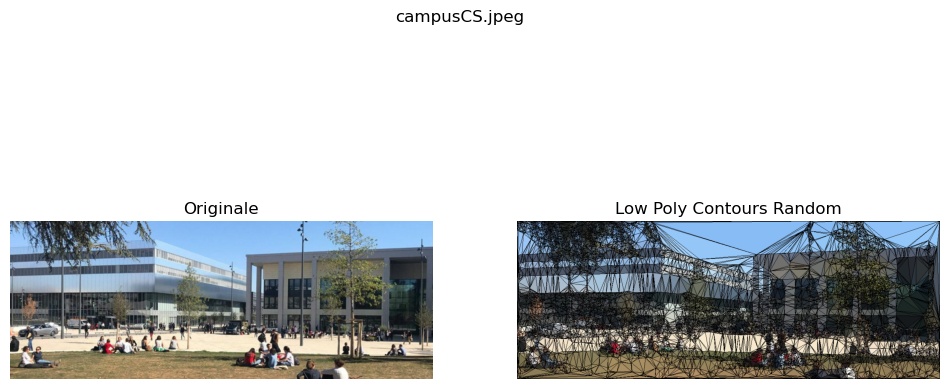

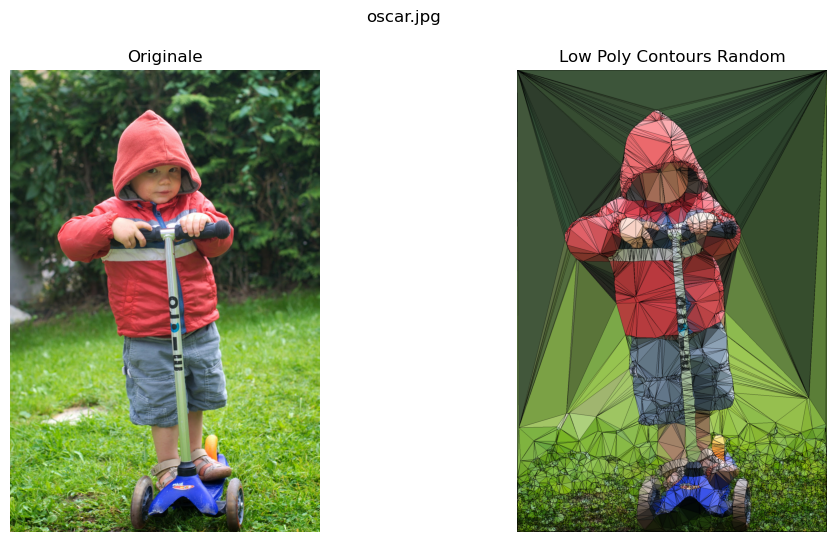

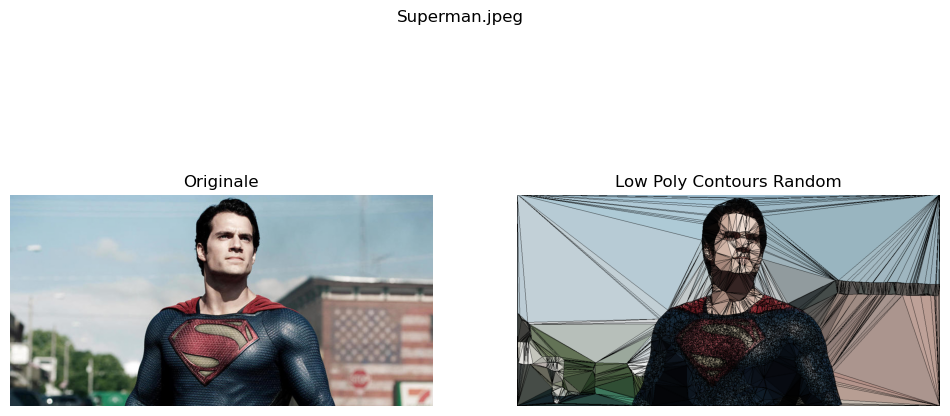

In [ ]:
input_directory = "./lowpoly"
output_directory = "./lowpoly_results_contours_random"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [
    f for f in os.listdir(input_directory) if f.lower().endswith(valid_extensions)
]

for filename in image_files:
    img_path = os.path.join(input_directory, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Erreur lors du chargement de l'image {filename}.")
        continue

    # Génération de l'image Low Poly
    low_poly_img = generate_low_poly_img(img)

    output_path = os.path.join(output_directory, f"low_poly_{filename}")
    cv2.imwrite(output_path, low_poly_img)

    # Affichage côte à côte de l'image originale et de l'image Low Poly
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(low_poly_img, cv2.COLOR_BGR2RGB))
    plt.title("Low Poly Contours Random")
    plt.axis("off")

    plt.suptitle(f"{filename}")
    plt.show()


#### 3. Sélection points d'intérêts: SIFT   

In [ ]:
def get_delaunay(image):
    points = select_interest_points(image, 10000)
    tri = Delaunay(points)
    return tri, points

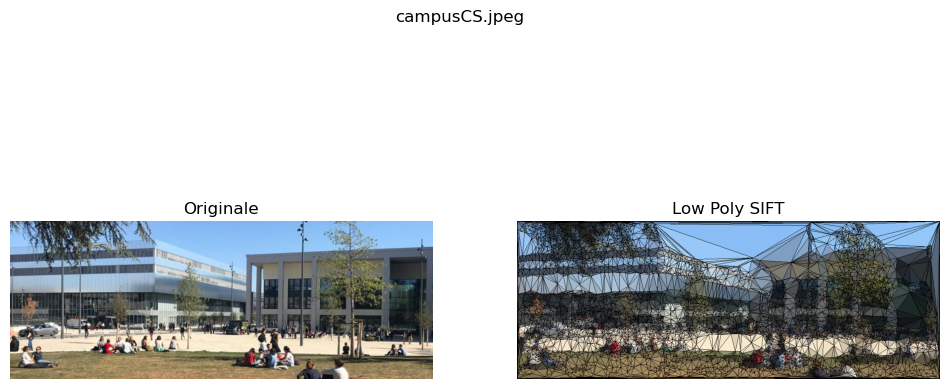

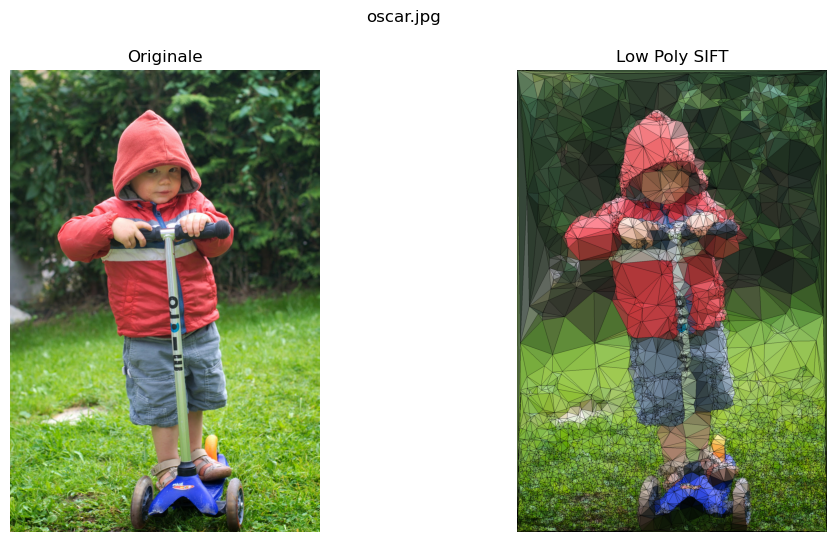

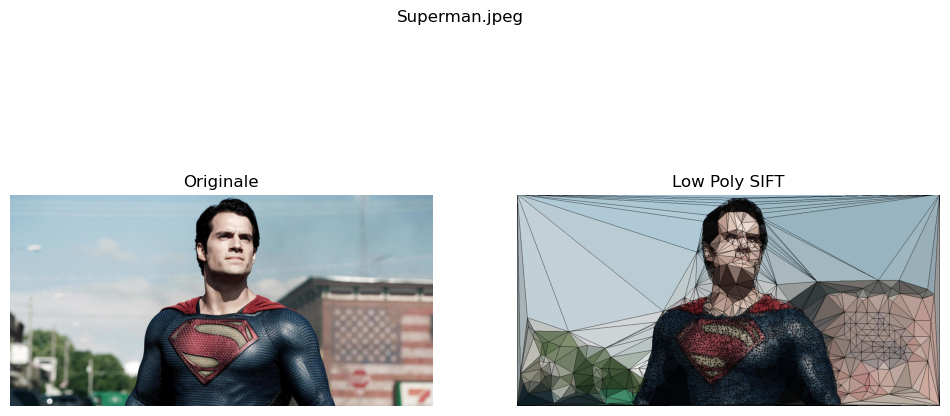

In [ ]:
import os
input_directory = "./lowpoly"
output_directory = "./lowpoly_results_sift"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [f for f in os.listdir(input_directory) if f.lower().endswith(valid_extensions)]

for filename in image_files:
    img_path = os.path.join(input_directory, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Erreur lors du chargement de l'image {filename}.")
        continue

    # Génération de l'image Low Poly
    low_poly_img = generate_low_poly_img(img)

    output_path = os.path.join(output_directory, f"low_poly_{filename}")
    cv2.imwrite(output_path, low_poly_img)

    # Affichage côte à côte de l'image originale et de l'image Low Poly
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(low_poly_img, cv2.COLOR_BGR2RGB))
    plt.title("Low Poly SIFT")
    plt.axis("off")

    plt.suptitle(f"{filename}")
    plt.show()


#### 4. Harris

In [ ]:
def get_delaunay(image):
    points = select_harris_points(image, 10000)
    tri = Delaunay(points)
    return tri, points

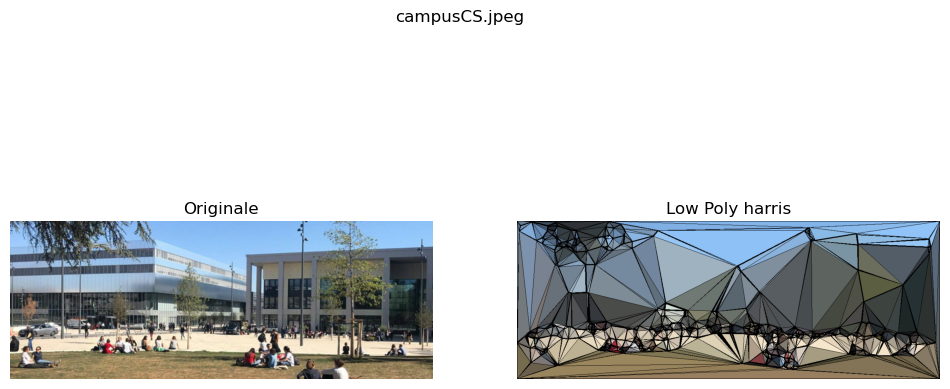

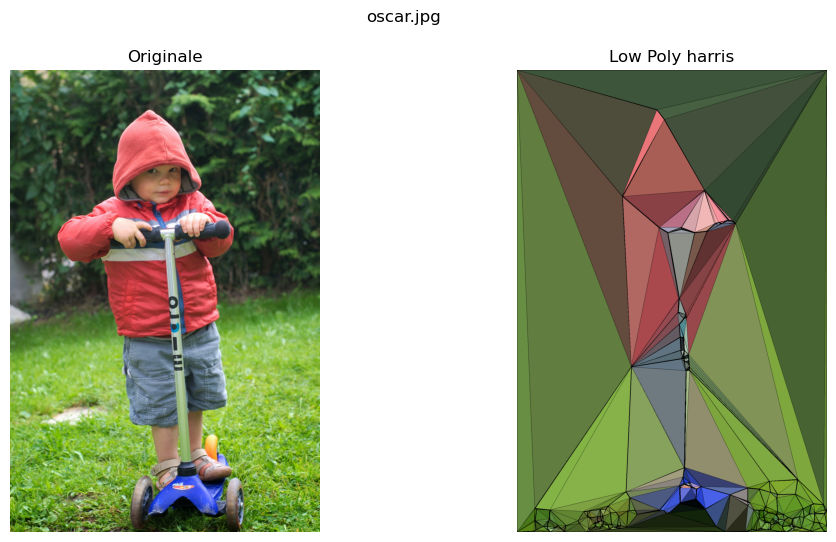

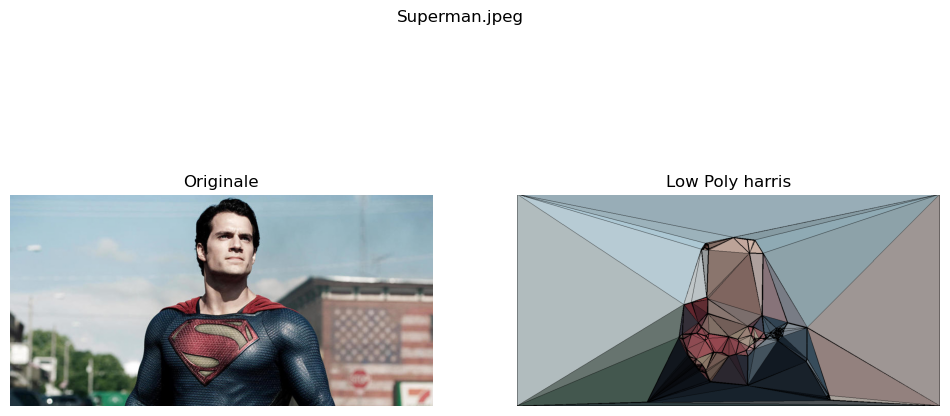

In [ ]:
input_directory = "./lowpoly"
output_directory = "./lowpoly_results_harris"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [f for f in os.listdir(input_directory) if f.lower().endswith(valid_extensions)]

for filename in image_files:
    img_path = os.path.join(input_directory, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Erreur lors du chargement de l'image {filename}.")
        continue

    low_poly_img = generate_low_poly_img(img)

    output_path = os.path.join(output_directory, f"low_poly_{filename}")
    cv2.imwrite(output_path, low_poly_img)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(low_poly_img, cv2.COLOR_BGR2RGB))
    plt.title("Low Poly harris")
    plt.axis("off")

    plt.suptitle(f"{filename}")
    plt.show()

#### 5. Shi Tomasi

In [ ]:
def get_delaunay(image):
    points = select_shi_tomasi_points(image, 10000)
    tri = Delaunay(points)
    return tri, points

C:\Users\Gabriel\AppData\Local\Temp\ipykernel_24628\508145267.py:13: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


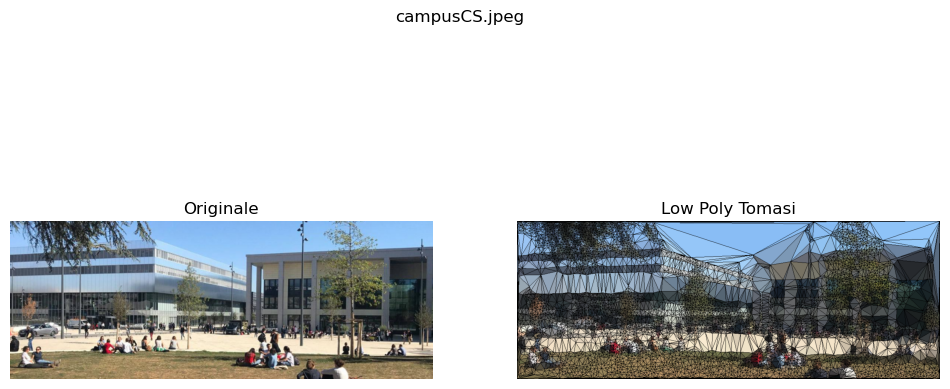

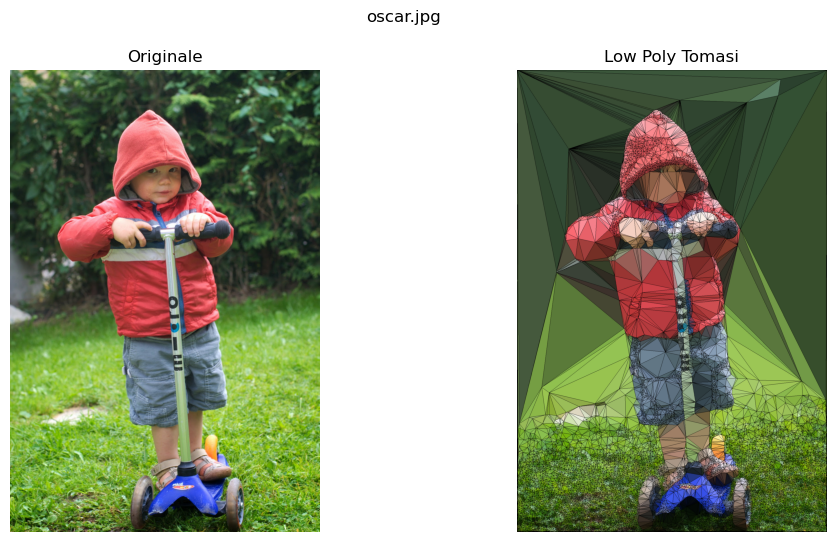

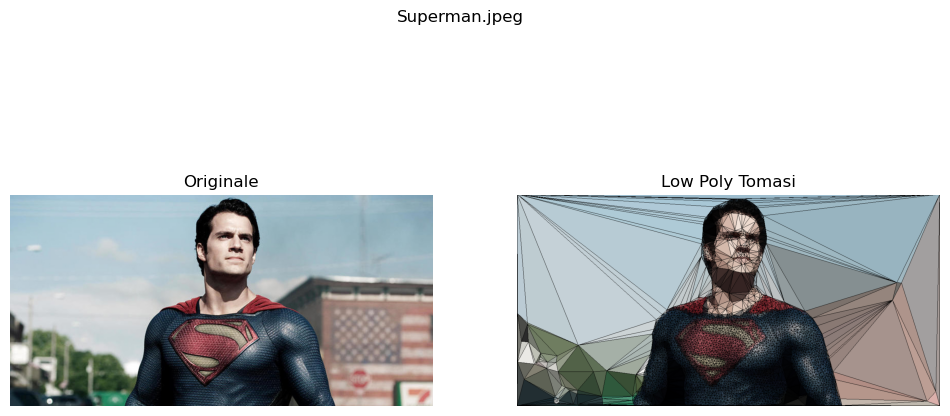

In [ ]:
input_directory = "./lowpoly"
output_directory = "./lowpoly_results_shi_tomasi"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [
    f for f in os.listdir(input_directory) if f.lower().endswith(valid_extensions)
]

for filename in image_files:
    img_path = os.path.join(input_directory, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Erreur lors du chargement de l'image {filename}.")
        continue

    low_poly_img = generate_low_poly_img(img)

    output_path = os.path.join(output_directory, f"low_poly_{filename}")
    cv2.imwrite(output_path, low_poly_img)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(low_poly_img, cv2.COLOR_BGR2RGB))
    plt.title("Low Poly Tomasi")
    plt.axis("off")

    plt.suptitle(f"{filename}")
    plt.show()

#### Results

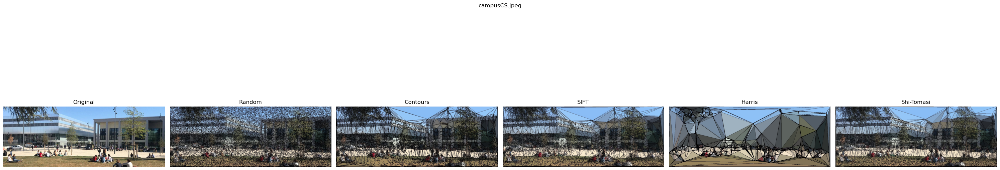

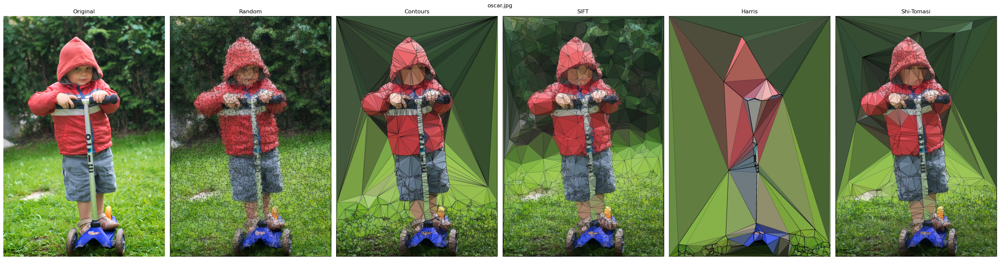

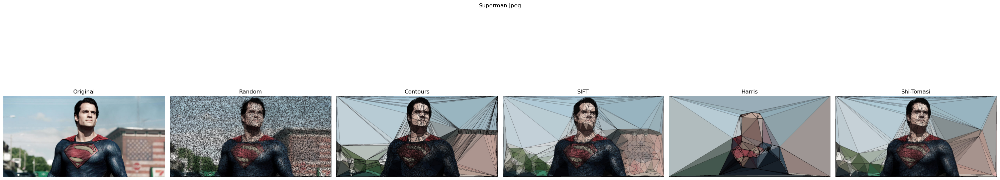

In [ ]:
import matplotlib.pyplot as plt

original_dir = "./lowpoly"
random_dir = "./lowpoly_results_random"
contours_dir = "./lowpoly_results_contours_random"
sift_dir = "./lowpoly_results_sift"
harris_dir = "./lowpoly_results_harris"
tomasi_dir = "./lowpoly_results_shi_tomasi"

valid_extensions = (".jpg", ".jpeg", ".png")
image_files = [f for f in os.listdir(original_dir) if f.lower().endswith(valid_extensions)]
for filename in image_files:
    original_path = os.path.join(original_dir, filename)
    random_path = os.path.join(random_dir, f"low_poly_{filename}")
    contours_path = os.path.join(contours_dir, f"low_poly_{filename}")
    sift_path = os.path.join(sift_dir, f"low_poly_{filename}")
    harris_path = os.path.join(harris_dir, f"low_poly_{filename}")
    tomasi_path = os.path.join(tomasi_dir, f"low_poly_{filename}")

    original_img = cv2.imread(original_path)
    random_img = cv2.imread(random_path)
    contours_img = cv2.imread(contours_path)
    sift_img = cv2.imread(sift_path)
    harris_img = cv2.imread(harris_path)
    tomasi_img = cv2.imread(tomasi_path)

    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    random_img = cv2.cvtColor(random_img, cv2.COLOR_BGR2RGB)
    contours_img = cv2.cvtColor(contours_img, cv2.COLOR_BGR2RGB)
    sift_img = cv2.cvtColor(sift_img, cv2.COLOR_BGR2RGB)
    harris_img = cv2.cvtColor(harris_img, cv2.COLOR_BGR2RGB)
    tomasi_img = cv2.cvtColor(tomasi_img, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 6, figsize=(30, 8))

    axs[0].imshow(original_img)
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(random_img)
    axs[1].set_title("Random")
    axs[1].axis("off")

    axs[2].imshow(contours_img)
    axs[2].set_title("Contours")
    axs[2].axis("off")

    axs[3].imshow(sift_img)
    axs[3].set_title("SIFT")
    axs[3].axis("off")

    axs[4].imshow(harris_img)
    axs[4].set_title("Harris")
    axs[4].axis("off")

    axs[5].imshow(tomasi_img)
    axs[5].set_title("Shi-Tomasi")
    axs[5].axis("off")

    plt.suptitle(f"{filename}")
    plt.tight_layout()
    plt.show()